<center> <font color = "Blue"> <span style = "font-family : 'Times New Roman' ; font-size: 28pt ; line-height: 1.5" <h1><b> Classification et Reconnaissance des Notes (Maqamat) de Musique Traditionnelle Mauritanienne à l'aide d'un LSTM  </span> </b></h1></font> </center> 

<center> <span style = "font-family: 'Times New Roman' ; font-size: 12pt ; line-height: 1.5" > Zeinebou TAKI <br>  Ahmed Bezeid  <br> Moulaye Ahmed Mohamed BRAHIM</span> </center>

 <center> <span style = "font-family: 'Times New Roman' ; font-size: 11pt"> Le 17 Mai 2024 </span> </center>

<p align="center">
  <img src="WhatsApp Image 2024-05-19 at 20.57.47.jpeg">
</p>

<a id="import"></a>
# <p style="background-color:midnightblue; font-family:calibri; font-size:130%; color:white; text-align:center; border-radius:10px 10px; padding:15px">INTRODUCTION ET OBJECTIFS DU PROJET </p>

<a id="import"></a>
# <p style="background-color:midnightblue; font-family:calibri; font-size:90%; color:white; text-align:center; border-radius:10px 10px; padding:10px">Introduction</p>

La musique traditionnelle mauritanienne est riche en histoire, en culture et en diversité. Au cœur de cette musique se trouve un instrument emblématique appelé le tidinit, qui produit une variété de notes et de mélodies. Pour classer ces mélodies et faciliter les relations du joueur avec l'instrument ainsi qu'avec la gamme musicale, les musiciens mauritaniens utilisent un système appelé les "maqamat". Les maqamat sont des séquences de signes musicaux organisés selon certaines dimensions et règles établies, permettant de classer les mélodies musicales de manière systématique.

Cependant, malgré l'importance des maqamat dans la musique mauritanienne, leur classification et leur reconnaissance manquent souvent de précision et nécessitent une expertise approfondie. Actuellement, il n'existe pas de méthode efficace pour automatiser cette classification complexe, ce qui limite la compréhension et l'analyse précises de la musique mauritanienne.

<a id="import"></a>
# <p style="background-color:midnightblue; font-family:calibri; font-size:90%; color:white; text-align:center; border-radius:10px 10px; padding:10px">Objectifs et utilité du projet</p>

Notre objectif principal est de développer un modèle de deep learning basé sur un LSTM capable de recevoir des enregistrements audio de musique traditionnelle mauritanienne contenant des notes de tidinit, et de les classifier avec précision en fonction de leur maqam. En fournissant un outil automatisé pour analyser la musique basée sur les maqamat, nous visons à faciliter la compréhension et l'étude de ce patrimoine musical riche et complexe.

Utilité et Impact :
Ce projet présente plusieurs avantages :

Préservation Culturelle : En automatisant la classification des maqamat, notre modèle contribuera à préserver et à documenter de manière précise la musique traditionnelle mauritanienne, facilitant ainsi sa transmission aux générations futures.
Accessibilité : En fournissant un outil automatisé pour reconnaître les maqamat, notre modèle rendra la musique mauritanienne plus accessible aux musiciens et aux chercheurs du monde entier, favorisant ainsi l'échange culturel et la diversité musicale.
Enrichissement de la Pratique Musicale : En facilitant l'identification précise des maqamat, notre modèle aidera les musiciens mauritaniens à explorer de nouvelles avenues créatives et à enrichir leur pratique musicale.


En combinant les traditions musicales anciennes avec les technologies modernes de deep learning, notre projet vise à ouvrir de nouvelles perspectives pour l'étude, la préservation et la diffusion de la musique traditionnelle mauritanienne, en particulier en ce qui concerne la classification des maqamat. Nous croyons fermement que notre modèle LSTM contribuera à enrichir la compréhension et l'appréciation de ce riche patrimoine culturel pour les générations présentes et futures.

<a id="import"></a>
# <p style="background-color:midnightblue; font-family:calibri; font-size:130%; color:white; text-align:center; border-radius:10px 10px; padding:15px">DATA PREPARATION</p>

<a id="import"></a>
# <p style="background-color:midnightblue; font-family:calibri; font-size:90%; color:white; text-align:center; border-radius:10px 10px; padding:10px">Chargement des packages & Importation des donnees</p>

In [140]:
import os
import librosa
import math
import json 
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn


import librosa
import librosa.display
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')

# Convertission des extenction : 

In [4]:
pip install pydub

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.3.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
import os

# Chemin vers le dossier contenant les fichiers audio
input_folder = r'C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset'

# Parcourir tous les genres et tous les fichiers audio pour vérifier leur existence
for genre_folder in os.listdir(input_folder):
    genre_path = os.path.join(input_folder, genre_folder)
    if os.path.isdir(genre_path):
        for filename in os.listdir(genre_path):
            file_path = os.path.join(genre_path, filename)
            if os.path.isfile(file_path):
                print(f"Found: {file_path}")
            else:
                print(f"Missing: {file_path}")


Found: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\karr\karr_guitar.mp3
Found: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\karr\karr_guitar2.mp3
Found: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\karr\khal karr 2.unknown
Found: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\karr\khall_karr.dat.unknown
Found: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\karr\khall_karr2.opus
Found: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\karr\seyni_karr.opus
Found: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\lebteyt\byad_lebteyt.opus
Found: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\lebteyt\khal_lebteyt.opus
Found: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\lebteyt\lebteyt 3.unknown
Found: C:\Users\hp\Downloads\My_Proj

In [142]:
import os
import subprocess

def convert_to_wav(input_file, output_file):
    command = ['C:\\Users\\hp\\Downloads\\ffmpeg-7.0-essentials_build\\ffmpeg-7.0-essentials_build\\bin\\ffmpeg.exe', '-i', input_file, output_file]
    try:
        subprocess.run(command, check=True)
        print(f"Converted: {input_file} to {output_file}")
    except subprocess.CalledProcessError as e:
        print(f"Conversion failed for {input_file}: {e}")

# Chemin vers le dossier contenant les fichiers audio
input_directory = r'C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset'

# Chemin vers le dossier de sortie pour les fichiers convertis
output_directory = r'C:\Users\hp\Downloads\My_Projects\traditional music generator\converted_audio'

# Vérifier si le dossier de sortie existe, sinon le créer
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Parcourir chaque fichier dans le répertoire
for subdir, dirs, files in os.walk(input_directory):
    for file in files:
        file_path = os.path.join(subdir, file)
        # Ignorer les répertoires et les fichiers non audio
        if os.path.isfile(file_path) and file_path.endswith(('.opus', '.unknown', '.mp3')):
            # Créer le chemin relatif par rapport au répertoire racine
            relative_path = os.path.relpath(file_path, input_directory)
            # Créer le chemin de sortie avec la même structure de sous-dossiers
            output_subdir = os.path.join(output_directory, os.path.dirname(relative_path))
            # Créer le dossier de sortie s'il n'existe pas
            if not os.path.exists(output_subdir):
                os.makedirs(output_subdir)
            # Créer le chemin de sortie complet avec l'extension .wav
            output_path = os.path.join(output_subdir, os.path.splitext(os.path.basename(file))[0] + '.wav')
            # Convertir le fichier audio au format wav
            convert_to_wav(file_path, output_path)


Converted: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\karr\karr_guitar.mp3 to C:\Users\hp\Downloads\My_Projects\traditional music generator\converted_audio\karr\karr_guitar.wav
Converted: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\karr\karr_guitar2.mp3 to C:\Users\hp\Downloads\My_Projects\traditional music generator\converted_audio\karr\karr_guitar2.wav
Converted: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\karr\khal karr 2.unknown to C:\Users\hp\Downloads\My_Projects\traditional music generator\converted_audio\karr\khal karr 2.wav
Converted: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\karr\khall_karr.dat.unknown to C:\Users\hp\Downloads\My_Projects\traditional music generator\converted_audio\karr\khall_karr.dat.wav
Converted: C:\Users\hp\Downloads\My_Projects\traditional music generator\music dataset\karr\khall_karr2.opus to C:\Users\hp\Downloads\My_Project

# Subdivision des audios en segments de 10 secondes

Les audios vont etre divisées en fichiers audio de 3 secondes (augmentant ainsi de 10 fois la quantité de données que nous alimentons dans nos modèles de classification). Avec les données, plus c’est toujours mieux.

In [143]:
from pydub import AudioSegment
import os

def split_to_segments(input_file, output_directory, segment_length=10):
    # Charger le fichier audio
    audio = AudioSegment.from_file(input_file)
    
    # Définir le nom du dossier de sortie pour conserver la structure
    relative_input_path = os.path.relpath(os.path.dirname(input_file), input_directory)
    subfolder_name = os.path.basename(relative_input_path)
    output_subdirectory = os.path.join(output_directory, relative_input_path)
    
    # Créer le dossier de sortie s'il n'existe pas
    if not os.path.exists(output_subdirectory):
        os.makedirs(output_subdirectory)
    
    # Définir la longueur du segment en millisecondes
    segment_length_ms = segment_length * 1000
    
    # Calculer le nombre de segments
    num_segments = len(audio) // segment_length_ms
    
    # Diviser le fichier audio en segments de 10 secondes
    for i in range(num_segments):
        start_time = i * segment_length_ms
        end_time = (i + 1) * segment_length_ms
        segment = audio[start_time:end_time]
        # Nom de fichier pour le segment
        segment_filename = f"{subfolder_name}_seg{i+1:02d}.wav"
        # Chemin complet pour le fichier de segment
        segment_path = os.path.join(output_subdirectory, segment_filename)
        # Enregistrer le segment
        segment.export(segment_path, format="wav")
        print(f"Segment saved: {segment_path}")

# Chemin vers le dossier contenant les fichiers audio
input_directory = r'C:\Users\hp\Downloads\My_Projects\traditional music generator\converted_audio'

# Chemin vers le dossier de sortie pour les segments
output_directory = r'C:\Users\hp\Downloads\My_Projects\traditional music generator\segments_audio'

# Parcourir chaque fichier dans le répertoire
for subdir, dirs, files in os.walk(input_directory):
    for file in files:
        file_path = os.path.join(subdir, file)
        # Ignorer les répertoires et les fichiers non audio
        if os.path.isfile(file_path) and file_path.endswith('.wav'):
            # Diviser le fichier audio en segments de 10 secondes
            split_to_segments(file_path, output_directory)

Segment saved: C:\Users\hp\Downloads\My_Projects\traditional music generator\segments_audio\karr\karr_seg01.wav
Segment saved: C:\Users\hp\Downloads\My_Projects\traditional music generator\segments_audio\karr\karr_seg02.wav
Segment saved: C:\Users\hp\Downloads\My_Projects\traditional music generator\segments_audio\karr\karr_seg03.wav
Segment saved: C:\Users\hp\Downloads\My_Projects\traditional music generator\segments_audio\karr\karr_seg04.wav
Segment saved: C:\Users\hp\Downloads\My_Projects\traditional music generator\segments_audio\karr\karr_seg05.wav
Segment saved: C:\Users\hp\Downloads\My_Projects\traditional music generator\segments_audio\karr\karr_seg06.wav
Segment saved: C:\Users\hp\Downloads\My_Projects\traditional music generator\segments_audio\karr\karr_seg07.wav
Segment saved: C:\Users\hp\Downloads\My_Projects\traditional music generator\segments_audio\karr\karr_seg08.wav
Segment saved: C:\Users\hp\Downloads\My_Projects\traditional music generator\segments_audio\karr\karr_se

In [144]:
import os
general_path = 'C:/Users/hp/Downloads/My_Projects/traditional music generator'
print(list(os.listdir(f'{general_path}/segments_audio/')))

['karr', 'lebteyt', 'lebyad', 'lkhall', 'va9ou']


# Extraction des caracteristiques

Le but est d'extraire les caractéristiques MFCC de chaque fichier audio et les stocke dans une DataFrame. Les étiquettes sont également stockées pour la classification.

In [145]:
import os
import librosa
import pandas as pd

# Fonction pour extraire les caractéristiques des fichiers audio
def extract_features(file_path):
    y, sr = librosa.load(file_path, duration=30)  # Charger le fichier audio et limiter à 30 secondes
    chroma_stft_mean = librosa.feature.chroma_stft(y=y, sr=sr).mean()
    chroma_stft_var = librosa.feature.chroma_stft(y=y, sr=sr).var()
    rms_mean = librosa.feature.rms(y=y).mean()
    rms_var = librosa.feature.rms(y=y).var()
    spectral_centroid_mean = librosa.feature.spectral_centroid(y=y, sr=sr).mean()
    spectral_centroid_var = librosa.feature.spectral_centroid(y=y, sr=sr).var()
    spectral_bandwidth_mean = librosa.feature.spectral_bandwidth(y=y, sr=sr).mean()
    spectral_bandwidth_var = librosa.feature.spectral_bandwidth(y=y, sr=sr).var()
    rolloff_mean = librosa.feature.spectral_rolloff(y=y, sr=sr).mean()
    rolloff_var = librosa.feature.spectral_rolloff(y=y, sr=sr).var()
    zero_crossing_rate_mean = librosa.feature.zero_crossing_rate(y).mean()
    zero_crossing_rate_var = librosa.feature.zero_crossing_rate(y).var()
    tempo = librosa.beat.tempo(y=y, sr=sr)[0]
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)
    mfcc_means = mfccs.mean(axis=1)
    mfcc_vars = mfccs.var(axis=1)
    
    # Retourner les caractéristiques sous forme de liste
    return [chroma_stft_mean, chroma_stft_var, rms_mean, rms_var, spectral_centroid_mean, spectral_centroid_var,
            spectral_bandwidth_mean, spectral_bandwidth_var, rolloff_mean, rolloff_var, zero_crossing_rate_mean,
            zero_crossing_rate_var, tempo] + mfcc_means.tolist() + mfcc_vars.tolist()

# Chemin d'accès au répertoire contenant les segments audio subdivisés
segments_directory = r'C:\Users\hp\Downloads\My_Projects\traditional music generator\segments_audio'

# Liste pour stocker les caractéristiques et les étiquettes
features = []
labels = []
filenames = []
lengths = []

# Parcourir chaque fichier audio dans le dossier
for genre in os.listdir(segments_directory):
    genre_folder = os.path.join(segments_directory, genre)
    if os.path.isdir(genre_folder):
        for file_name in os.listdir(genre_folder):
            file_path = os.path.join(genre_folder, file_name)
            if file_path.endswith(".wav"):  # S'assurer que le fichier est au format WAV
                try:
                    file_features = extract_features(file_path)
                    features.append(file_features)
                    labels.append(genre)
                    filenames.append(file_name)
                    lengths.append(librosa.get_duration(filename=file_path))
                except Exception as e:
                    print(f"Erreur lors de l'extraction des caractéristiques pour {file_path}: {e}")

# Créer un DataFrame à partir des caractéristiques et des étiquettes
data = pd.DataFrame(features, columns=[
    'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var',
    'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean', 'rolloff_var', 'zero_crossing_rate_mean',
    'zero_crossing_rate_var', 'tempo'] + [f'mfcc{i}_mean' for i in range(1, 21)] + [f'mfcc{i}_var' for i in range(1, 21)])
data.insert(0, 'filename', filenames)
data.insert(1, 'length', lengths)
data['label'] = labels

# Afficher les premières lignes pour vérifier
data.head()


,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc12_var,mfcc13_var,mfcc14_var,mfcc15_var,mfcc16_var,mfcc17_var,mfcc18_var,mfcc19_var,mfcc20_var,label
0,karr_seg01.wav,10.0,0.251844,0.098292,0.155676,0.003849,674.246315,396079.098749,778.901987,137105.032071,...,41.897297,34.264496,23.335186,27.325401,23.471411,23.119028,19.496529,24.704031,24.383139,karr
1,karr_seg02.wav,10.0,0.278949,0.099054,0.195931,0.003042,686.992644,28305.653311,804.155991,24946.409605,...,50.158260,26.450779,26.654554,29.768003,35.498222,30.010365,38.192013,27.539190,24.787870,karr
2,karr_seg03.wav,10.0,0.270569,0.096634,0.195921,0.002664,712.794217,34116.351945,839.062832,36037.786863,...,48.360600,41.133167,26.002573,27.321011,34.063576,36.776642,38.312840,22.969097,28.147936,karr
3,karr_seg04.wav,10.0,0.257703,0.090762,0.199989,0.004163,656.890742,21026.573731,823.373611,36750.782743,...,41.293556,42.715427,27.823246,28.366604,27.727501,24.878998,33.155766,22.290438,22.193550,karr
4,karr_seg05.wav,10.0,0.271826,0.100851,0.194203,0.004105,654.460403,20187.455740,791.354389,23957.864701,...,42.016495,23.652824,21.011843,32.230618,41.444450,26.133986,34.317970,35.848660,32.214310,karr


In [146]:
data.shape

(262, 56)

In [75]:
data.to_csv('features_30_sec.csv', index=True)

<a id="import"></a>
# <p style="background-color:midnightblue; font-family:calibri; font-size:130%; color:white; text-align:center; border-radius:10px 10px; padding:15px">DATA EXPLORATION</p>



## Understanding Audio
Explorons d'abord nos données audio pour voir à quoi elles ressemblent (nous travaillerons avec le fichier `karr_seg01.wav`).

* **Sound**: séquence de vibrations avec différentes forces de pression (`y`)
* The **sample rate** (`sr`) est le nombre d'échantillons audio transportés par seconde, mesuré en Hz ou kHz.

In [31]:
# Chemin vers un fichier audio d'exemple
audio_path = f'{general_path}/audio_segments/karr/karr_seg01.wav'

# Chargement du fichier audio
y, sr = librosa.load(audio_path)

# Affichage des premières informations sur le fichier audio
print(f'Audio data (y): {y[:10]}')  # Afficher les 10 premières valeurs de y
print(f'Sample rate (sr): {sr}')  # Afficher le taux d'échantillonnage

# Lecture du fichier audio
ipd.Audio(audio_path)

Audio data (y): [-8.2799143e-06 -3.2529515e-05 -2.9673523e-05 -2.9548106e-05
  4.7529693e-06  1.4022644e-05 -2.9350509e-05  5.6150775e-06
  3.4912766e-05  2.8342793e-05]
Sample rate (sr): 22050


In [34]:
print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

# Verify length of the audio
print('Check Len of Audio:', 661794/22050)

y: [-8.2799143e-06 -3.2529515e-05 -2.9673523e-05 ... -6.4346112e-02
 -6.7787923e-02 -7.6099396e-02] 

y shape: (661500,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 30.013333333333332


    y : Le signal audio sous forme de tableau numpy. Chaque élément représente l'amplitude du son à un instant donné.
    sr : Le taux d'échantillonnage, c'est-à-dire le nombre d'échantillons par seconde. Dans ce cas, il est de 22050 Hz (ou 22.05 KHz).

Dans le code suivant, nous utilisons librosa.effects.trim pour supprimer le silence initial et final d'un signal audio. Cette étape est importante pour obtenir des représentations plus précises du signal audio sans les parties silencieuses inutiles.

In [35]:
# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
audio_file, _ = librosa.effects.trim(y)

# the result is an numpy ndarray
print('Audio File:', audio_file, '\n')
print('Audio File shape:', np.shape(audio_file))

Audio File: [-6.1649297e-07  2.7180022e-08  3.3611573e-07 ... -6.4346112e-02
 -6.7787923e-02 -7.6099396e-02] 

Audio File shape: (656892,)


### 2D Representation: Sound Waves

Pour visualiser la forme d'onde d'un fichier audio après suppression du silence :

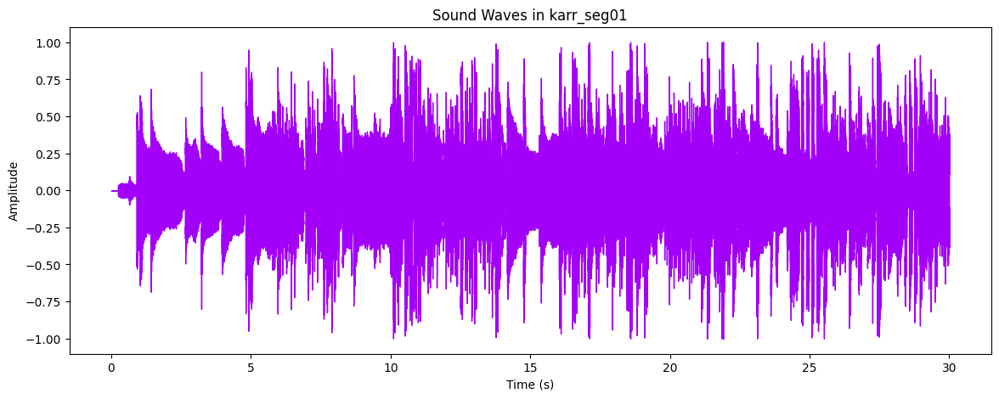

In [33]:
# Affichage de la forme d'onde
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr, color="#A300F9")
plt.title("Sound Waves in karr_seg01")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()

### Transformation de Fourier

* La transformation de Fourier transforme un signal du domaine temporel en domaine fréquentiel. Nous allons utiliser la transformation de Fourier à court terme (STFT) pour obtenir une représentation spectrale du signal audio.
Paramètres pour la STFT
* n_fft : La taille de la fenêtre FFT, par défaut 2048.
*hop_length : Le nombre de trames audio entre les colonnes STFT successives, par défaut 512.

Shape of D object: (1025, 1283)


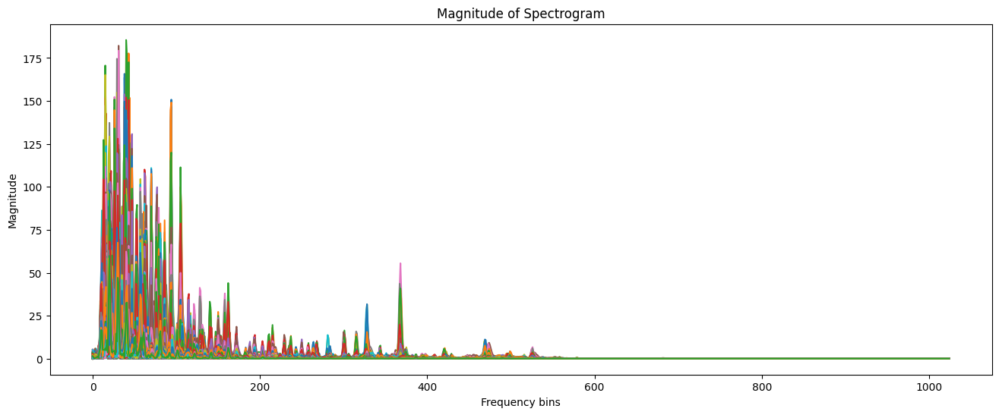

In [37]:
# Taille de la fenêtre FFT
n_fft = 2048

# Nombre de trames audio entre les colonnes STFT
hop_length = 512

# Transformation de Fourier à court terme (STFT)
D = np.abs(librosa.stft(audio_file, n_fft=n_fft, hop_length=hop_length))

# Affichage de la forme de l'objet D
print('Shape of D object:', np.shape(D))

# Visualisation de la magnitude du spectrogramme
plt.figure(figsize=(16, 6))
plt.plot(D)
plt.title("Magnitude of Spectrogram")
plt.xlabel("Frequency bins")
plt.ylabel("Magnitude")
plt.show()

### Le Spectrogramme

* Un spectrogramme est une représentation visuelle du spectre des fréquences d'un signal en fonction du temps. Il est souvent utilisé pour analyser les caractéristiques fréquentielles des signaux audio.([wiki](https://en.wikipedia.org/wiki/Spectrogram)).
* Ici, nous convertissons l’axe des fréquences en un axe logarithmique.

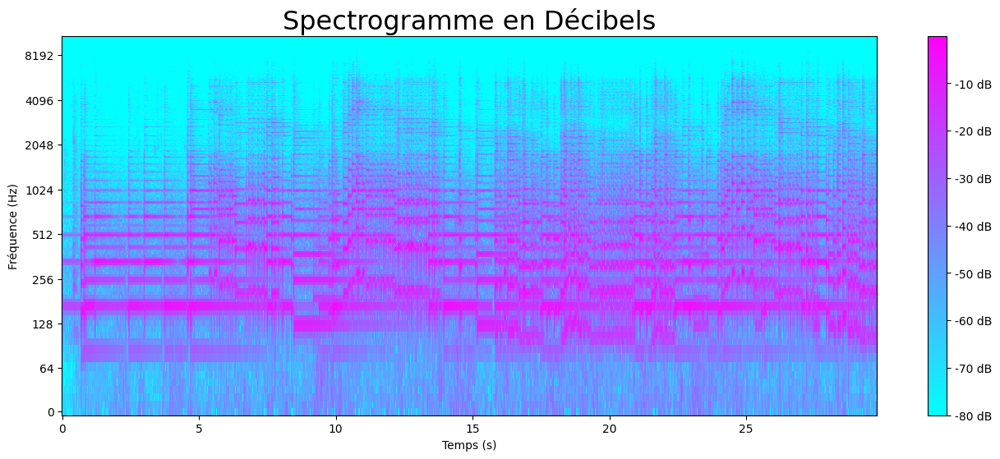

In [38]:
# Conversion du spectrogramme d'amplitude en spectrogramme en décibels
DB = librosa.amplitude_to_db(D, ref=np.max)

# Création du spectrogramme
plt.figure(figsize=(16, 6))
librosa.display.specshow(DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='cool')
plt.colorbar(format='%+2.0f dB')
plt.title("Spectrogramme en Décibels", fontsize=23)
plt.xlabel("Temps (s)")
plt.ylabel("Fréquence (Hz)")
plt.show()

### Mel Spectrogram

* Le Mel spectrogram est un spectrogramme avec une échelle Mel sur l'axe des fréquences. L'échelle Mel est une transformation non linéaire de l'échelle des fréquences qui imite la perception humaine des fréquences sonores.

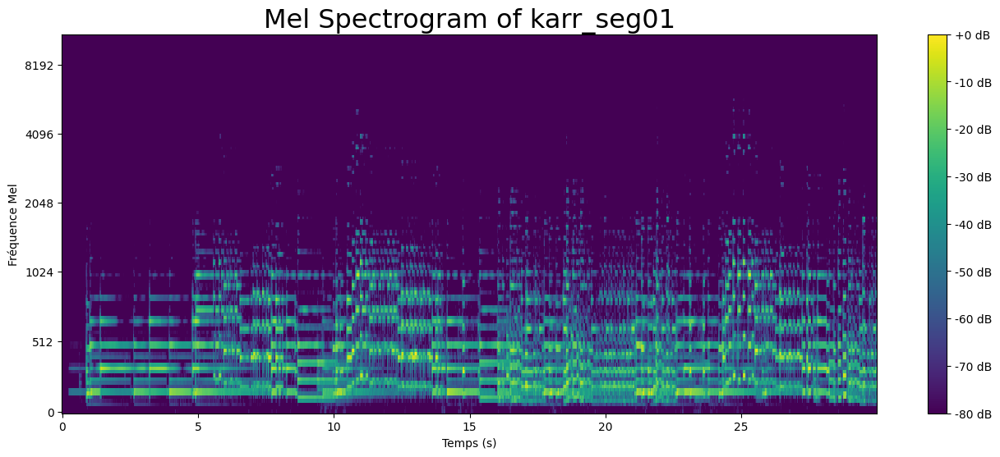

In [40]:
# Calcul du Mel spectrogramme
S = librosa.feature.melspectrogram(y=y, sr=sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)

# Visualisation du Mel spectrogramme
plt.figure(figsize=(16, 6))
librosa.display.specshow(S_DB, sr=sr, x_axis='time', y_axis='mel', cmap='viridis')
plt.colorbar(format='%+2.0f dB')
plt.title("Mel Spectrogram of karr_seg01", fontsize=23)
plt.xlabel("Temps (s)")
plt.ylabel("Fréquence Mel")
plt.show()

### Caractéristiques Audio

* Les caractéristiques audio sont des mesures quantitatives extraites des signaux audio qui capturent différentes propriétés telles que le rythme, la tonalité, la texture, etc. Voici comment extraire et visualiser certaines caractéristiques audio couramment utilisées à partir d'un fichier audio.



### Taux de Franchissement de Zéro (Zero Crossing Rate)


* Le taux de franchissement de zéro mesure la fréquence à laquelle le signal change de positif à négatif ou inversement.

In [42]:
# Calcul du taux de franchissement de zéro
zero_crossings = librosa.zero_crossings(audio_file, pad=False)
print("Nombre total de franchissements de zéro :", sum(zero_crossings))


Nombre total de franchissements de zéro : 25508


### Harmonics and Perceptrual

* Les harmoniques représentent les caractéristiques que l'oreille humaine ne peut pas distinguer, tandis que les
* percussions représentent le rythme et l'émotion du son.

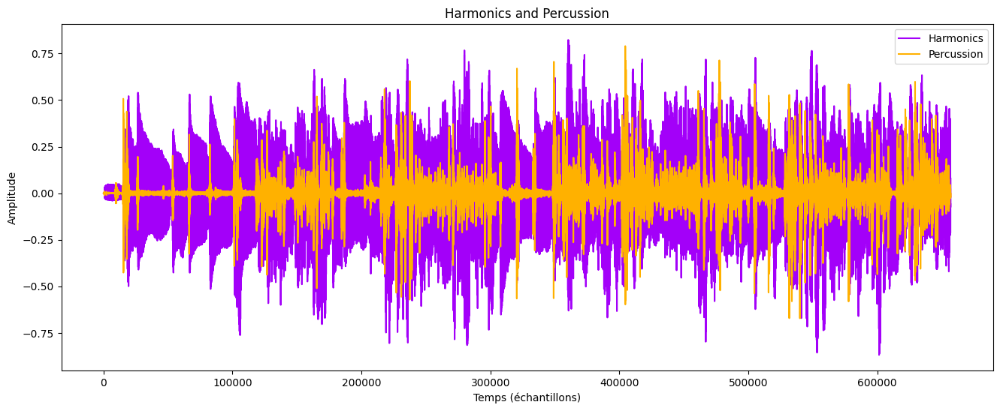

In [43]:
# Décomposition en harmoniques et percussions
y_harm, y_perc = librosa.effects.hpss(audio_file)

# Visualisation des harmoniques et percussions
plt.figure(figsize=(16, 6))
plt.plot(y_harm, color='#A300F9', label='Harmonics')
plt.plot(y_perc, color='#FFB100', label='Percussion')
plt.legend()
plt.title("Harmonics and Percussion")
plt.xlabel("Temps (échantillons)")
plt.ylabel("Amplitude")
plt.show()


### Mel-Frequency Cepstral Coefficients (Coefficients Cepstraux de Fréquence Mel (MFCC)):


* Les coefficients cepstraux de fréquence Mel (MFCC) sont un ensemble de caractéristiques qui décrivent de manière concise la forme générale de l'enveloppe spectrale d'un signal. Ils modelise les caracteristique de la voix humaine

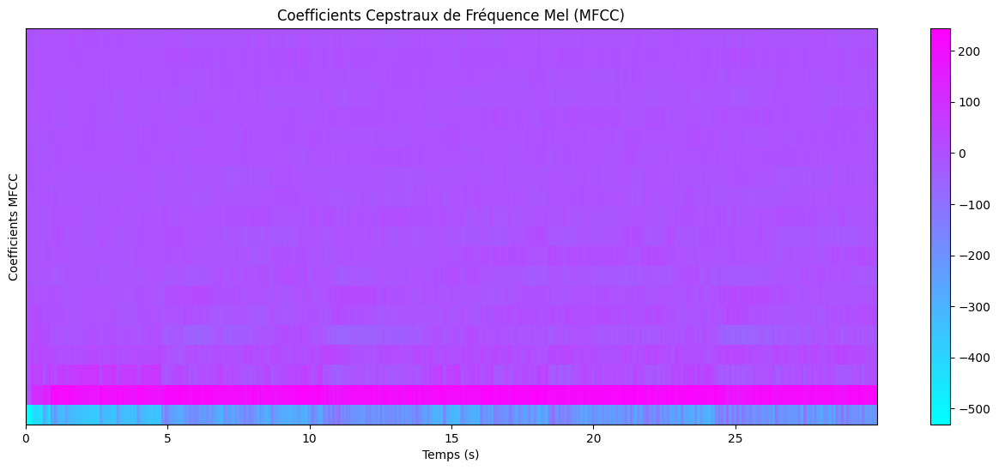

In [58]:
# Calcul des coefficients MFCC
mfccs = librosa.feature.mfcc(y=y, sr=sr)

# Visualisation des MFCCs
plt.figure(figsize=(16, 6))
librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap='cool')
plt.title("Coefficients Cepstraux de Fréquence Mel (MFCC)")
plt.xlabel("Temps (s)")
plt.ylabel("Coefficients MFCC")
plt.colorbar()
plt.show()


Les donnees doivent etre mis a l'echelle :

Mean: -1.1810208e-09 

Var: 1.0


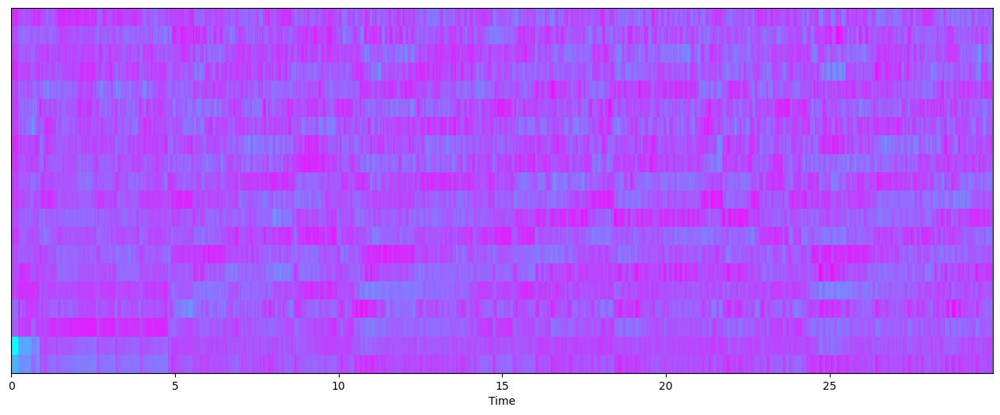

In [60]:
# Perform Feature Scaling
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
print('Mean:', mfccs.mean(), '\n')
print('Var:', mfccs.var())

plt.figure(figsize = (16, 6))
librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap = 'cool');

### Fréquences Chromatiques

* Les caractéristiques chromatiques sont une représentation puissante de l'audio musical dans laquelle l'ensemble du spectre est projeté sur 12 bins représentant les 12 demi-tons distincts de l'octave musicale.




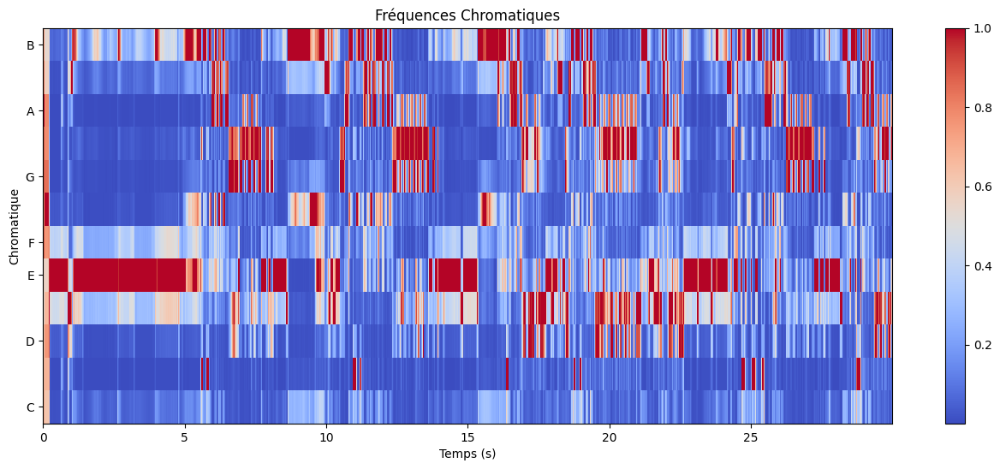

In [62]:
# Calcul des fréquences chromatiques
chromagram = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=hop_length)

# Visualisation des fréquences chromatiques
plt.figure(figsize=(16, 6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')
plt.title("Fréquences Chromatiques")
plt.xlabel("Temps (s)")
plt.ylabel("Chromatique")
plt.colorbar()
plt.show()


## EDA

L'ensemble de données contient des informations sur diverses fonctionnalités audio extraites de différents fichiers audio. Chaque ligne représente un fichier audio et les colonnes représentent différentes caractéristiques, notamment la moyenne et la variance de diverses caractéristiques audio.

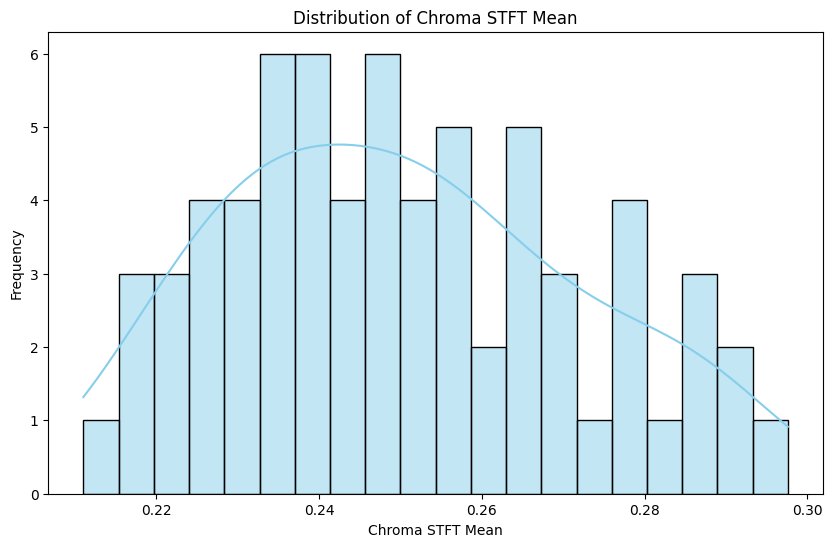

In [63]:
# Distribution of a specific feature (e.g., Chroma STFT mean)
plt.figure(figsize=(10, 6))
sns.histplot(data['chroma_stft_mean'], bins=20, kde=True, color='skyblue')
plt.title('Distribution of Chroma STFT Mean')
plt.xlabel('Chroma STFT Mean')
plt.ylabel('Frequency')
plt.show()


### Correlation Heatmap pour les features

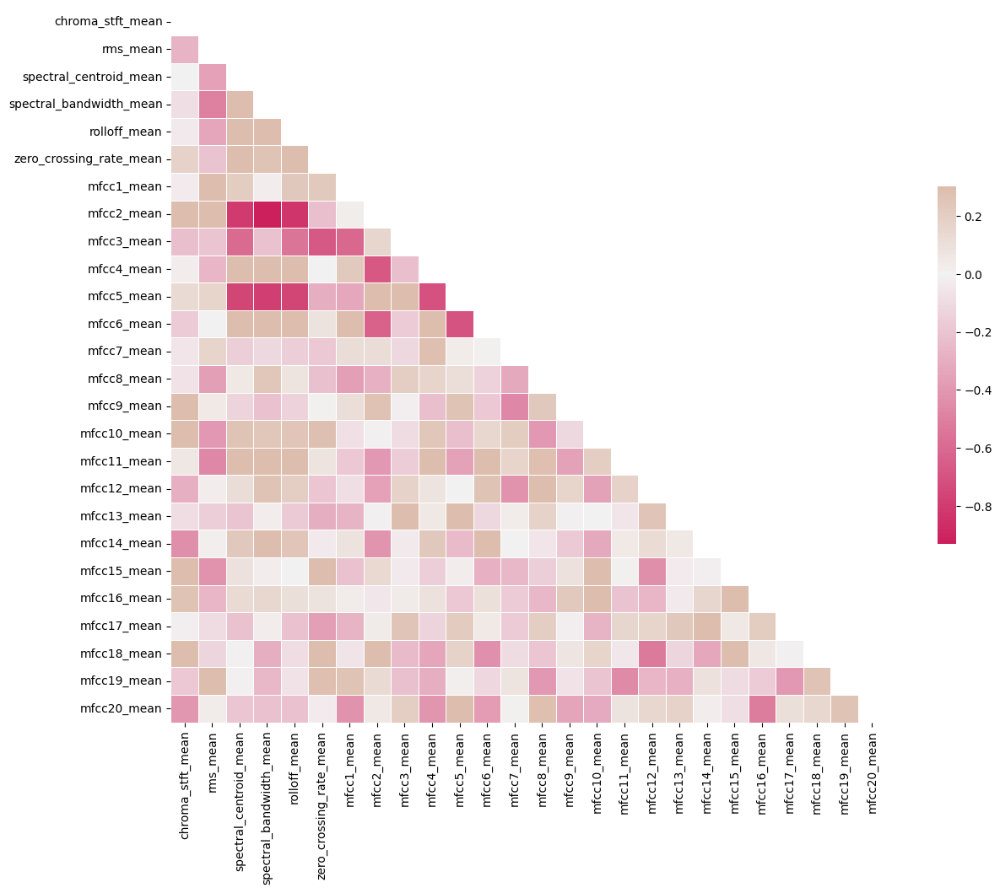

In [68]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `data` is your DataFrame and `spike_cols` are the columns of interest
# Computing the Correlation Matrix
spike_cols = [col for col in data.columns if 'mean' in col]
corr = data[spike_cols].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 11))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(0, 25, as_cmap=True, s = 90, l = 45, n = 5)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Display the heatmap
plt.show()


### Box Plot de la Distribution des Genres 

La boîte à moustaches des distributions de BPM (battements par minute) pour chaque genre musical offre une vue comparative des tempos moyens entre les genres.

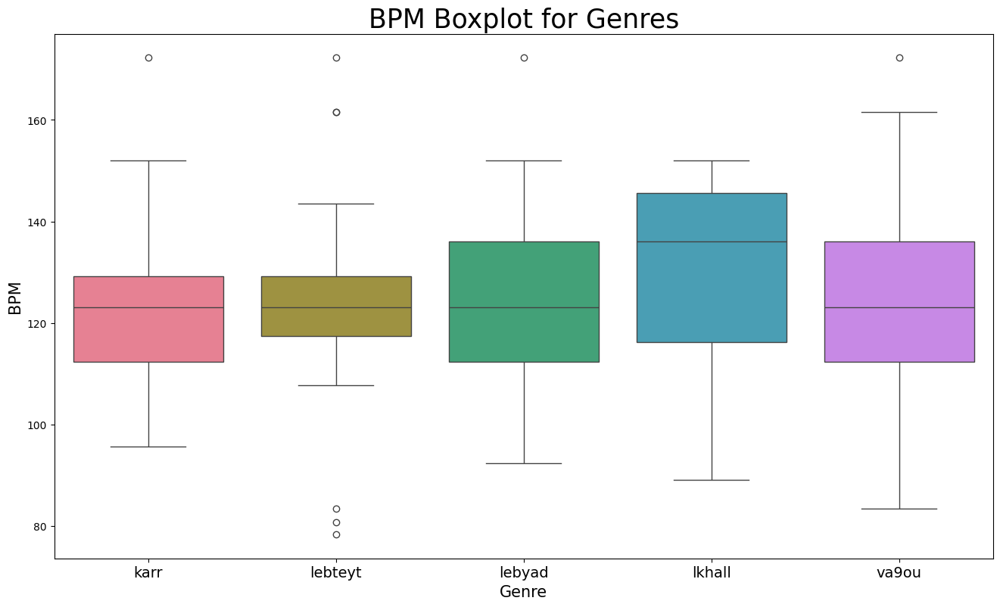

In [63]:
x = data[["label", "tempo"]]

f, ax = plt.subplots(figsize=(16, 9));
sns.boxplot(x = "label", y = "tempo", data = x, palette = 'husl');

plt.title('BPM Boxplot for Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BPM", fontsize = 15)
plt.savefig("BPM Boxplot.jpg")

### Analyse en Composantes Principales (PCA) - Visualisation des Groupes Potentiels de Genres

La PCA est une technique de réduction de dimensionnalité qui peut être utilisée pour visualiser la structure des données et identifier les groupes potentiels. Voici comment nous pouvons appliquer la PCA à nos données pour visualiser les groupes de genres musicaux :
1. Normalisation
2. PCA
3. Le Scatter Plot

In [33]:
from sklearn import preprocessing

data = data.iloc[0:, 1:]
y = data['label']
X = data.loc[:, data.columns != 'label']

#### NORMALIZE X ####
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns = cols)


#### PCA 2 COMPONENTS ####
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

# concatenate with target label
finalDf = pd.concat([principalDf, y], axis = 1)

pca.explained_variance_ratio_

# 44.93 variance explained

array([0.40844185, 0.1256871 ])

Variance Expliquée par les Deux Premières Composantes Principales: [0.40844185 0.1256871 ]


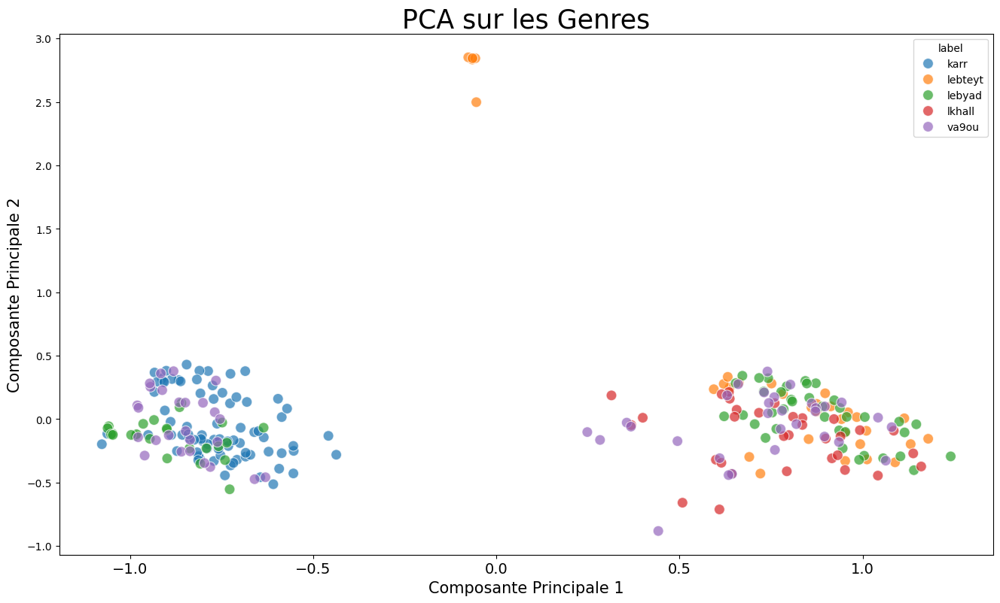

In [34]:
from sklearn import preprocessing

# Extraction des données
data = data.iloc[0:, 1:]
y = data['label']
X = data.loc[:, data.columns != 'label']

# Normalisation des données
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns=cols)

# PCA avec 2 composantes
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2'])

# Concaténation avec la variable cible
finalDf = pd.concat([principalDf, y], axis=1)

# Variance expliquée
explained_variance_ratio = pca.explained_variance_ratio_
print("Variance Expliquée par les Deux Premières Composantes Principales:", explained_variance_ratio)

# Scatter Plot
plt.figure(figsize=(16, 9))
sns.scatterplot(x="principal component 1", y="principal component 2", data=finalDf, hue="label", alpha=0.7, s=100)
plt.title('PCA sur les Genres', fontsize=25)
plt.xlabel("Composante Principale 1", fontsize=15)
plt.ylabel("Composante Principale 2", fontsize=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=10)
plt.savefig("PCA Scattert.jpg")


<a id="import"></a>
# <p style="background-color:midnightblue; font-family:calibri; font-size:130%; color:white; text-align:center; border-radius:10px 10px; padding:15px">LSTM STRUCTURE</p>

In [41]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 262 entries, 0 to 261
Data columns (total 56 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 262 non-null    object 
 1   length                   262 non-null    float64
 2   chroma_stft_mean         262 non-null    float32
 3   chroma_stft_var          262 non-null    float32
 4   rms_mean                 262 non-null    float32
 5   rms_var                  262 non-null    float32
 6   spectral_centroid_mean   262 non-null    float64
 7   spectral_centroid_var    262 non-null    float64
 8   spectral_bandwidth_mean  262 non-null    float64
 9   spectral_bandwidth_var   262 non-null    float64
 10  rolloff_mean             262 non-null    float64
 11  rolloff_var              262 non-null    float64
 12  zero_crossing_rate_mean  262 non-null    float64
 13  zero_crossing_rate_var   262 non-null    float64
 14  tempo                    2

In [147]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping

# Séparer les caractéristiques et les labels
X = data.drop(columns=['filename', 'length','label'])
y = data['label']

# Encoder les labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
y_categorical = to_categorical(y_encoded)

# Normaliser les caractéristiques
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Reshape les données pour LSTM (n_samples, n_timesteps, n_features)
X_reshaped = X_scaled.reshape((X_scaled.shape[0], 1, X_scaled.shape[1]))

# Séparer les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y_categorical, test_size=0.2, random_state=42)

In [148]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout


# Définir le modèle
model = Sequential()
model.add(LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model.add(Dropout(0.5))  # Augmenter le taux de Dropout
model.add(LSTM(128, return_sequences=True))  # Ajouter une couche LSTM supplémentaire
model.add(Dropout(0.5))
model.add(LSTM(64))  # Ajouter une autre couche LSTM avec moins d'unités
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu', kernel_regularizer='l2'))  # Ajouter L2 régularisation
model.add(Dense(len(label_encoder.classes_), activation='softmax'))


model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])



# Entraîner le modèle
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2)

Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 271ms/step - accuracy: 0.2664 - loss: 2.2336 - val_accuracy: 0.3810 - val_loss: 2.1886
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.3736 - loss: 2.1756 - val_accuracy: 0.4048 - val_loss: 2.1337
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.4359 - loss: 2.1170 - val_accuracy: 0.4048 - val_loss: 2.0776
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.4421 - loss: 2.0617 - val_accuracy: 0.4048 - val_loss: 2.0185
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.4494 - loss: 1.9974 - val_accuracy: 0.3810 - val_loss: 1.9501
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.4545 - loss: 1.9175 - val_accuracy: 0.3810 - val_loss: 1.8635
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.4709 - loss: 1.8210 - val_accuracy: 0.3810 - val_loss: 1.7580
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.4817 - loss: 1.7088 - val_accuracy: 0.3810 - val_los

In [149]:
# Évaluer le modèle sur l'ensemble de test
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {accuracy * 100:.2f}%')

# Faire des prédictions sur de nouvelles données
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

# Afficher le rapport de classification
from sklearn.metrics import classification_report
print(classification_report(y_true_classes, y_pred_classes, target_names=label_encoder.classes_))


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.7657 - loss: 1.0082
Test Accuracy: 77.36%
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step
              precision    recall  f1-score   support

        karr       0.84      0.94      0.89        17
     lebteyt       0.50      0.80      0.62         5
      lebyad       0.92      0.92      0.92        12
      lkhall       1.00      0.20      0.33         5
       va9ou       0.69      0.64      0.67        14

    accuracy                           0.77        53
   macro avg       0.79      0.70      0.68        53
weighted avg       0.80      0.77      0.76        53



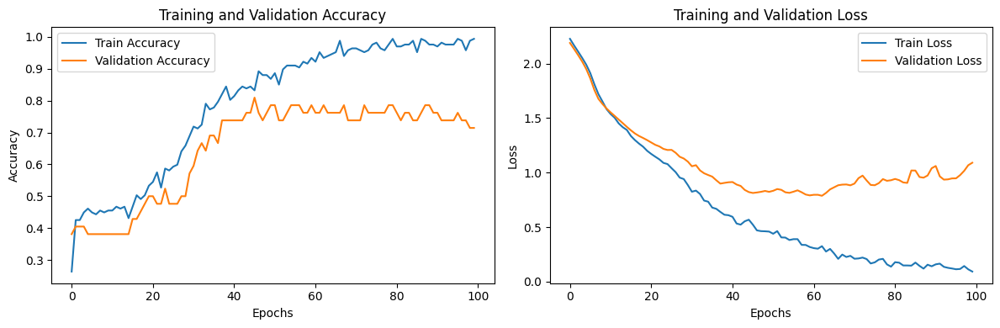

In [150]:
# Visualiser les courbes d'apprentissage
plt.figure(figsize=(12, 4))

# Précision
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

# Perte
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.tight_layout()
plt.show()

In [151]:
def extract_features(file_path):
    import librosa
    y, sr = librosa.load(file_path, duration=30)
    chroma_stft_mean = librosa.feature.chroma_stft(y=y, sr=sr).mean()
    chroma_stft_var = librosa.feature.chroma_stft(y=y, sr=sr).var()
    rms_mean = librosa.feature.rms(y=y).mean()
    rms_var = librosa.feature.rms(y=y).var()
    spectral_centroid_mean = librosa.feature.spectral_centroid(y=y, sr=sr).mean()
    spectral_centroid_var = librosa.feature.spectral_centroid(y=y, sr=sr).var()
    spectral_bandwidth_mean = librosa.feature.spectral_bandwidth(y=y, sr=sr).mean()
    spectral_bandwidth_var = librosa.feature.spectral_bandwidth(y=y, sr=sr).var()
    rolloff_mean = librosa.feature.spectral_rolloff(y=y, sr=sr).mean()
    rolloff_var = librosa.feature.spectral_rolloff(y=y, sr=sr).var()
    zero_crossing_rate_mean = librosa.feature.zero_crossing_rate(y).mean()
    zero_crossing_rate_var = librosa.feature.zero_crossing_rate(y).var()
    tempo = librosa.beat.tempo(y=y, sr=sr)[0]
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)
    mfcc_means = mfccs.mean(axis=1)
    mfcc_vars = mfccs.var(axis=1)
    
    return [chroma_stft_mean, chroma_stft_var, rms_mean, rms_var, spectral_centroid_mean, spectral_centroid_var,
            spectral_bandwidth_mean, spectral_bandwidth_var, rolloff_mean, rolloff_var, zero_crossing_rate_mean,
            zero_crossing_rate_var, tempo] + mfcc_means.tolist() + mfcc_vars.tolist()

def predict_genre(file_path):
    # Extraire les caractéristiques
    features = extract_features(file_path)
    features_scaled = scaler.transform([features])
    features_reshaped = features_scaled.reshape((1, 1, features_scaled.shape[1]))

    # Prédire avec le modèle LSTM
    prediction = model.predict(features_reshaped)
    predicted_class = np.argmax(prediction, axis=1)

    # Convertir le label encodé en genre
    predicted_genre = label_encoder.inverse_transform(predicted_class)
    return predicted_genre[0]

# Exemple d'utilisation
predicted_genre = predict_genre('C:/Users/hp/Downloads/test.wav')
print(f'The predicted genre is: {predicted_genre}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
The predicted genre is: va9ou


<a id="import"></a>
# <p style="background-color:midnightblue; font-family:calibri; font-size:130%; color:white; text-align:center; border-radius:10px 10px; padding:15px">CNN STRUCTURE</p>

In [25]:
#!pip install music21

In [54]:
#!pip install abjad

In [4]:
#!pip install scikit-image

In [21]:
import os
import numpy as np
import librosa
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from skimage.transform import resize

In [5]:


# Chemin vers le répertoire contenant les sous-dossiers de fichiers audio
directory = r'C:\Users\hp\Downloads\My_Projects\traditional music generator\segments_audio'
output_directory = r'C:\Users\hp\Downloads\My_Projects\traditional music generator\spectrograms'

# Création du dossier de sortie s'il n'existe pas
os.makedirs(output_directory, exist_ok=True)

# Parcours des sous-dossiers
for subdir in os.listdir(directory):
    subdirectory = os.path.join(directory, subdir)
    if os.path.isdir(subdirectory):
        # Parcours des fichiers audio dans chaque sous-dossier
        for filename in os.listdir(subdirectory):
            if filename.endswith('.wav'):  # Assurez-vous que vous avez des fichiers audio WAV
                filepath = os.path.join(subdirectory, filename)
                
                # Chargement du fichier audio
                y, sr = librosa.load(filepath)
                
                # Prétraitement et tracé du spectrogramme
                plt.figure(figsize=(10, 4))
                spectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
                librosa.display.specshow(librosa.power_to_db(spectrogram, ref=np.max),
                                         y_axis='mel', fmax=8000, x_axis='time')
                plt.colorbar(format='%+2.0f dB')
                plt.title('Spectrogram')
                plt.tight_layout()
                
                # Enregistrement du spectrogramme sous forme d'image
                output_path = os.path.join(output_directory, subdir)
                os.makedirs(output_path, exist_ok=True)
                output_filename = os.path.splitext(filename)[0] + '.png'
                plt.savefig(os.path.join(output_path, output_filename))
                plt.close()

# Chargement des images et labels
images = []
labels = []
label_map = {}

for idx, subdir in enumerate(os.listdir(output_directory)):
    subdirectory = os.path.join(output_directory, subdir)
    if os.path.isdir(subdirectory):
        label_map[subdir] = idx
        for filename in os.listdir(subdirectory):
            if filename.endswith('.png'):
                image = plt.imread(os.path.join(subdirectory, filename))
                images.append(image)
                labels.append(idx)

In [6]:
# Convertir les listes en tableaux numpy
images = np.array(images)
labels = np.array(labels)

# Taille cible pour les images
target_size = (128, 128)

# Redimensionner les images
resized_images = []
for image in images:
    resized_image = resize(image, target_size, anti_aliasing=True)
    resized_images.append(resized_image)

In [7]:
# Convertir la liste en tableau numpy
images = np.array(resized_images)

# Normaliser les images
images = images / 255.0

# Convertir les labels en one-hot encoding
labels = to_categorical(labels, num_classes=len(label_map))

In [38]:
# Diviser les données en ensembles d'entraînement et de validation
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.2, random_state=42)

# Vérification des formes des données
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"y_val shape: {y_val.shape}")

X_train shape: (209, 128, 128, 4)
y_train shape: (209, 5)
X_val shape: (53, 128, 128, 4)
y_val shape: (53, 5)


In [39]:
# Construire le modèle CNN amélioré
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(target_size[0], target_size[1], images.shape[3])),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),
    
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),
    
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),
    
    layers.Conv2D(256, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),
    
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(len(label_map), activation='softmax')
])

In [40]:
# Compilation du modèle
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [41]:
# Entraîner le modèle
history = model.fit(X_train, y_train, epochs=50, validation_data=(X_val, y_val))

Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 611ms/step - accuracy: 0.2471 - loss: 1.6028 - val_accuracy: 0.3208 - val_loss: 1.5142
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 598ms/step - accuracy: 0.3062 - loss: 1.5869 - val_accuracy: 0.3208 - val_loss: 1.5514
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 630ms/step - accuracy: 0.2894 - loss: 1.5601 - val_accuracy: 0.3208 - val_loss: 1.5645
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 712ms/step - accuracy: 0.2733 - loss: 1.5677 - val_accuracy: 0.2264 - val_loss: 1.5516
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 675ms/step - accuracy: 0.2398 - loss: 1.5874 - val_accuracy: 0.3208 - val_loss: 1.5367
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 669ms/step - accuracy: 0.2704 - loss: 1.5773 - val_accuracy: 0.3208 - val_loss: 1.5281
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 660ms/step - accuracy: 0.2563 - loss: 1.5957 - val_accuracy: 0.3208 - val_loss: 1.5292
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 654ms/step - accuracy: 0.2655 - loss: 1.5717 - val_accuracy: 0.3208 - val_loss:

In [42]:
# Prédictions sur les données de validation
y_val_pred = model.predict(X_val)
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_val_true_classes = np.argmax(y_val, axis=1)


# Évaluer le modèle sur l'ensemble de test
loss, accuracy = model.evaluate(X_val, y_val)
print(f'Test Accuracy: {accuracy * 100:.2f}%')

# Générer un rapport de classification
print("Classification Report:")
print(classification_report(y_val_true_classes, y_val_pred_classes, target_names=label_map.keys()))

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - accuracy: 0.3180 - loss: 1.5321
Test Accuracy: 32.08%
Classification Report:
              precision    recall  f1-score   support

        karr       0.32      1.00      0.49        17
     lebteyt       0.00      0.00      0.00         5
      lebyad       0.00      0.00      0.00        12
      lkhall       0.00      0.00      0.00         5
       va9ou       0.00      0.00      0.00        14

    accuracy                           0.32        53
   macro avg       0.06      0.20      0.10        53
weighted avg       0.10      0.32      0.16        53



C:\Users\hp\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hp\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hp\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier

In [43]:
# Sauvegarder le modèle entraîné
model.save('music_genre_recognizer_cnn.h5')

In [56]:
import librosa
import numpy as np
from skimage.transform import resize

# Liste des genres
genres = ['karr', 'lebteyt', 'lebyad', 'lkhall', 'va9ou']

def predict_genre(audio_path, model):
    # Préparer le fichier audio
    y, sr = librosa.load(audio_path)
    spectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
    spectrogram_db = librosa.power_to_db(spectrogram, ref=np.max)

    # Redimensionner le spectrogramme
    target_size = (128, 128)
    resized_spectrogram = resize(spectrogram_db, target_size, anti_aliasing=True)
    
    # Normaliser le spectrogramme
    resized_spectrogram = resized_spectrogram / np.max(resized_spectrogram)
    
    # Si le modèle attend des images avec 4 canaux, dupliquez le canal unique pour en faire une image 4 canaux
    if model.input_shape[-1] == 4:
        resized_spectrogram = np.stack((resized_spectrogram,) * 4, axis=-1)
    elif model.input_shape[-1] == 3:
        resized_spectrogram = np.stack((resized_spectrogram,) * 3, axis=-1)
    elif model.input_shape[-1] == 1 and len(resized_spectrogram.shape) == 2:
        resized_spectrogram = np.expand_dims(resized_spectrogram, axis=-1)
    
    # Ajouter une dimension pour le lot
    input_spectrogram = np.expand_dims(resized_spectrogram, axis=0)

    # Vérifier les formes
    print(f"Shape of input spectrogram: {input_spectrogram.shape}")
    print(f"Model input shape: {model.input_shape}")
    
    # Prédire le genre
    prediction = model.predict(input_spectrogram)
    predicted_class = np.argmax(prediction, axis=1)[0]

    return predicted_class




In [57]:
# Exemple d'utilisation
audio_path = r'C:/Users/hp/Downloads/test.wav'
predicted_genre_index = predict_genre(audio_path, model)
predicted_genre_name = genres[predicted_genre_index]
print(f'Le genre prédit pour l\'audio est : {predicted_genre_name}')

Shape of input spectrogram: (1, 128, 128, 4)
Model input shape: (None, 128, 128, 4)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
Le genre prédit pour l'audio est : karr


<a id="import"></a>
# <p style="background-color:midnightblue; font-family:calibri; font-size:130%; color:white; text-align:center; border-radius:10px 10px; padding:15px">RECOMMENDER SYSTEM</p>


"Recomender" Systems nous permettre de trouver pour chaque vecteur la meilleur similarite en ordere decroissant du meilleur correspondance au pire correspondance. 

pour les fichier audio, cela se fait avec `cosine_similarity` library.

In [43]:

import IPython.display as ipd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing


data.set_index('filename', inplace=True)
labels = data[['label']]

data = data.drop(columns=['length', 'label'])
data.head()

data_scaled = preprocessing.scale(data)
print('Scaled data type:', type(data_scaled))

data_scaled_df = pd.DataFrame(data_scaled, index=data.index, columns=data.columns)
data_scaled_df.head()

Scaled data type: <class 'numpy.ndarray'>


,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc11_var,mfcc12_var,mfcc13_var,mfcc14_var,mfcc15_var,mfcc16_var,mfcc17_var,mfcc18_var,mfcc19_var,mfcc20_var
filename,,,,,,,,,,,,,,,,,,,,,
karr_seg01.wav,-0.278814,0.757060,0.160718,0.801701,-0.815777,2.292799,-1.027909,0.831049,-0.920917,1.478304,...,-0.969359,-1.003912,-1.089512,-1.346337,-1.157812,-1.069810,-0.845188,-1.169690,-1.167376,-1.206108
karr_seg02.wav,0.075307,0.828478,0.663106,0.367054,-0.794893,-0.567692,-0.952904,-0.661276,-0.884666,-0.635631,...,-0.750753,-0.918083,-1.235555,-1.244646,-1.047630,-0.504399,-0.585596,-0.376174,-1.015414,-1.183891
karr_seg03.wav,-0.034176,0.601555,0.662991,0.163586,-0.752619,-0.522497,-0.849231,-0.513700,-0.811726,-0.454566,...,-0.817293,-0.936760,-0.961132,-1.264620,-1.158010,-0.571845,-0.330716,-0.371045,-1.260367,-0.999451
karr_seg04.wav,-0.202270,0.050947,0.713761,0.970853,-0.844213,-0.624308,-0.895828,-0.504213,-0.893250,-0.653659,...,-0.698668,-1.010185,-0.931559,-1.208842,-1.110845,-0.869720,-0.778891,-0.589934,-1.296743,-1.326298
karr_seg05.wav,-0.017749,0.997049,0.641546,0.939436,-0.848195,-0.630835,-0.990925,-0.674429,-0.935570,-0.713021,...,-0.906818,-1.002674,-1.287851,-1.417514,-0.936546,-0.224851,-0.731617,-0.540605,-0.570033,-0.776240


### Cosine similarity

calcule la *similitude cosinus par paire* pour chaque combinaison de chansons dans les données. Il en résulte une matrice de 1000 x 1000 (avec une redondance dans l'information puisque la similarité de l'élément A avec l'élément B == la similarité de l'élément B avec l'élément A).

In [44]:
# Cosine similarity
similarity = cosine_similarity(data_scaled)
print("Similarity shape:", similarity.shape)

sim_df_labels = pd.DataFrame(similarity)
sim_df_names = sim_df_labels.set_index(labels.index)
sim_df_names.columns = labels.index

sim_df_names.head()

Similarity shape: (262, 262)


filename,karr_seg01.wav,karr_seg02.wav,karr_seg03.wav,karr_seg04.wav,karr_seg05.wav,karr_seg06.wav,karr_seg07.wav,karr_seg08.wav,karr_seg09.wav,karr_seg10.wav,...,va9ou_seg48.wav,va9ou_seg49.wav,va9ou_seg50.wav,va9ou_seg51.wav,va9ou_seg52.wav,va9ou_seg53.wav,va9ou_seg54.wav,va9ou_seg55.wav,va9ou_seg56.wav,va9ou_seg57.wav
filename,,,,,,,,,,,,,,,,,,,,,
karr_seg01.wav,1.000000,0.307625,0.250009,0.263302,0.248611,0.188035,-0.171836,0.071673,0.191592,0.145421,...,0.234199,0.208992,0.205288,0.186145,0.112865,0.115628,0.462540,0.087547,0.036634,0.014474
karr_seg02.wav,0.307625,1.000000,0.949374,0.753172,0.856778,0.636521,-0.002479,0.460150,0.608838,0.495975,...,0.440236,0.422704,0.426575,0.447974,0.453224,0.049134,0.113477,0.460477,0.374155,0.281010
karr_seg03.wav,0.250009,0.949374,1.000000,0.766691,0.875361,0.694863,-0.004492,0.415657,0.666218,0.526641,...,0.439153,0.421623,0.428490,0.434567,0.498271,-0.009916,0.115395,0.499276,0.465684,0.350403
karr_seg04.wav,0.263302,0.753172,0.766691,1.000000,0.768288,0.615072,-0.122772,0.257852,0.591310,0.392793,...,0.374570,0.534737,0.471198,0.532941,0.453213,-0.104366,0.094984,0.550084,0.438939,0.346611
karr_seg05.wav,0.248611,0.856778,0.875361,0.768288,1.000000,0.690789,-0.043441,0.340673,0.654711,0.550244,...,0.453025,0.492311,0.483130,0.492742,0.491326,-0.021161,0.079991,0.564287,0.405414,0.307774


### Song similarity scoring

`find_similar_songs()` - est une fonction prédéfinie qui prend le nom de la chanson et renvoie les 5 meilleures correspondances pour cette chanson.

In [45]:
def find_similar_songs(name):
    series = sim_df_names[name].sort_values(ascending = False)
    
    series = series.drop(name)
    
    
    print("\n*******\nSimilar songs to ", name)
    print(series.head(5))

### Testons la Similarity Function :

In [49]:
find_similar_songs('lebteyt_seg06.wav') 

ipd.Audio(f'{general_path}/segments_audio/va9ou/va9ou_seg04.wav')


*******
Similar songs to  lebteyt_seg06.wav
filename
va9ou_seg16.wav      0.760934
lebyad_seg32.wav     0.759471
lebteyt_seg27.wav    0.726658
lkhall_seg22.wav     0.725902
lebyad_seg29.wav     0.712178
Name: lebteyt_seg06.wav, dtype: float64


In [152]:
ipd.Audio(f'{general_path}/segments_audio/va9ou/va9ou_seg16.wav')

<a id="import"></a>
# <p style="background-color:midnightblue; font-family:calibri; font-size:130%; color:white; text-align:center; border-radius:10px 10px; padding:15px">Conclusion</p>